### Importing necessary libraries

In [104]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pyspark.sql import SparkSession
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.functions import col as fcol, sum
from pyspark.sql.window import Window
from pyspark.sql import functions as F
from pyspark.sql import DataFrame
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score,confusion_matrix, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier


### Opening spark session

In [105]:
# Check if the SparkSession already exists
if os.path.exists("spark-session.pid"):
    # Delete the existing SparkSession
    os.remove("spark-session.pid")

# Create a new SparkSession
spark = SparkSession.builder.master("local[*]").appName("NBAShotLogs").getOrCreate()

### Defining the data preprocessing function

In [106]:
#--------------------------Data Preprocessing--------------------------

def preprocess(data):
    # Get the columns with missing values
    null_columns = data.columns[data.isnull().any()]

    if len(null_columns) == 0:
        print("No columns with null values found.")
        return
    
    print("columns with null values found: ", null_columns.values)

    # Fill missing values with the next valid value along the column
    for column in null_columns:
        if data[column].isnull().any():
            data[column] = data[column].fillna(method='ffill')

    # Replace the negative values in the TOUCH_TIME column with the mean value of the positive values
    mean_touch_time_positive = data['TOUCH_TIME'][data['TOUCH_TIME'] > 0].mean()
    data['TOUCH_TIME'] = data['TOUCH_TIME'].apply(lambda x: x if x > 0 else round(mean_touch_time_positive, 1))

    # Drop the FGM column and the make the shot_made_flag column 0 or 1
    data.drop('FGM', axis=1, inplace=True)
    data['SHOT_RESULT'] = data['SHOT_RESULT'].apply(lambda x: 1 if x == 'made' else 0)

    # Replace the win and lose column with 1 and 0
    data['W'] = data['W'].apply(lambda x: 1 if x == 'W' else 0)

    # Convert the GAME_CLOCK column to seconds
    data['GAME_CLOCK'] = data['GAME_CLOCK'].apply(lambda x: float(x.split(':')[0]) * 60 + float(x.split(':')[1]))

    # Handle the outliers in the numerical columns (optional)
    numerical_columns = data.select_dtypes(include=[np.number]).columns
    filtered_data = data.copy()  # Create a copy to avoid modifying original data
    # for col in numerical_columns:
    #     Q1 = filtered_data[col].quantile(0.25)
    #     Q3 = filtered_data[col].quantile(0.75)
    #     IQR = Q3 - Q1
    #     lower_bound = Q1 - 1.5 * IQR
    #     upper_bound = Q3 + 1.5 * IQR
    #     filtered_data = filtered_data.loc[(filtered_data[col] >= lower_bound) & (filtered_data[col] <= upper_bound)]

    return filtered_data

In [107]:
print("Data Preprocessing")
data = pd.read_csv("shot_logs.csv")
data = preprocess(data)
# print the dribbles column sorted in descending order
print(data['DRIBBLES'].sort_values(ascending=False))

Data Preprocessing
columns with null values found:  ['SHOT_CLOCK']


C:\Users\anase\AppData\Local\Temp\ipykernel_7136\1741174936.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[column] = data[column].fillna(method='ffill')


121565    32
108507    31
77107     31
125774    31
92422     30
          ..
74600      0
74599      0
74598      0
74597      0
64034      0
Name: DRIBBLES, Length: 128069, dtype: int64


### Data visualization

columns with null values found:  ['SHOT_CLOCK']


C:\Users\anase\AppData\Local\Temp\ipykernel_7136\1741174936.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[column] = data[column].fillna(method='ffill')


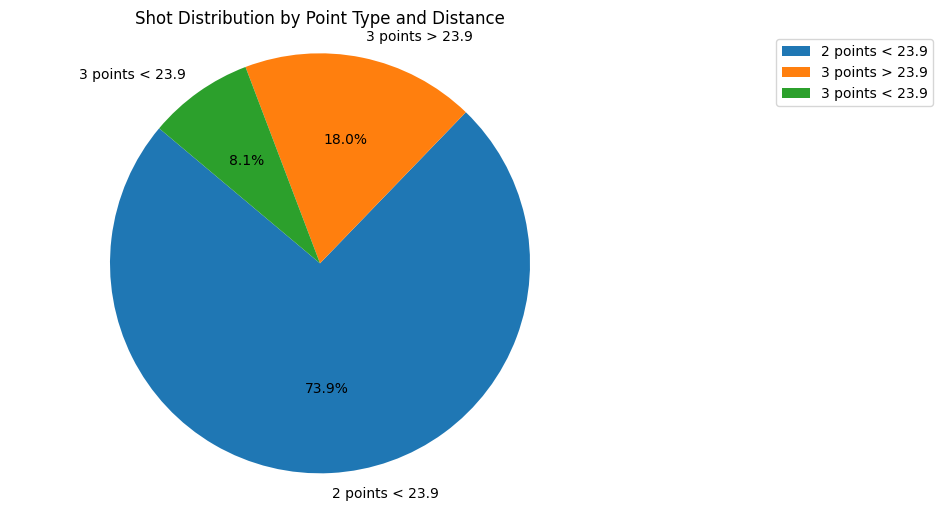

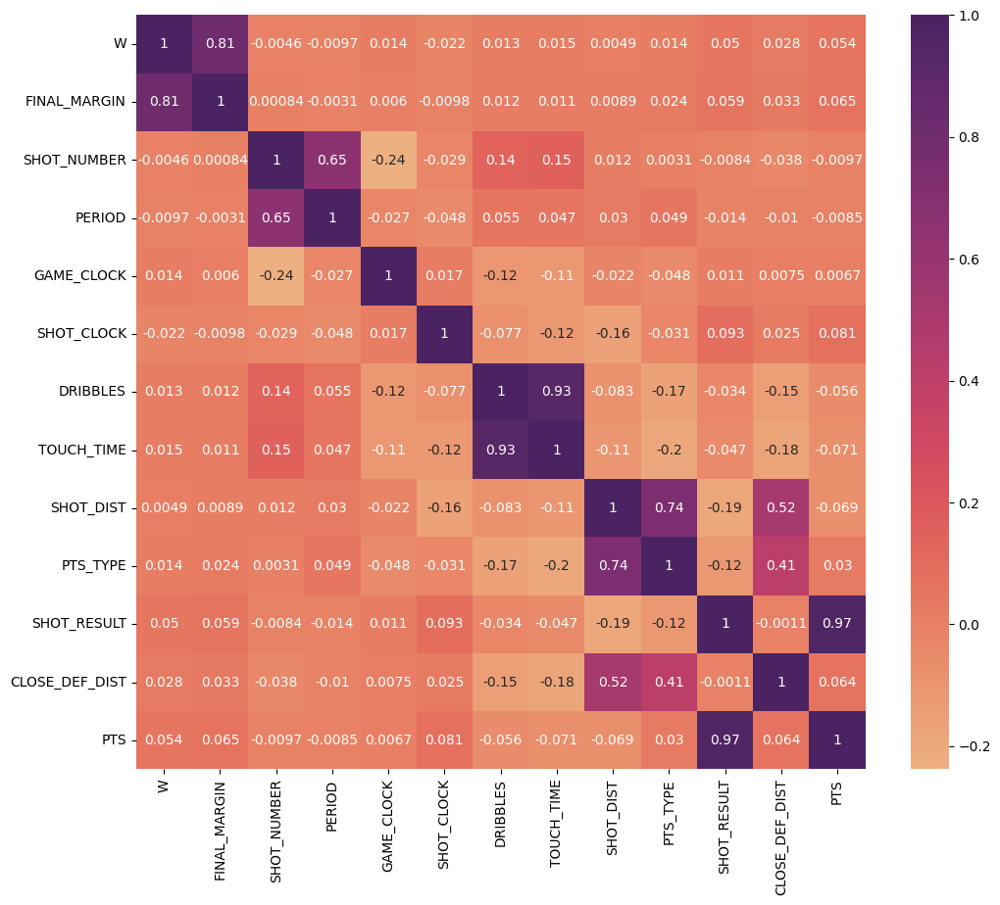

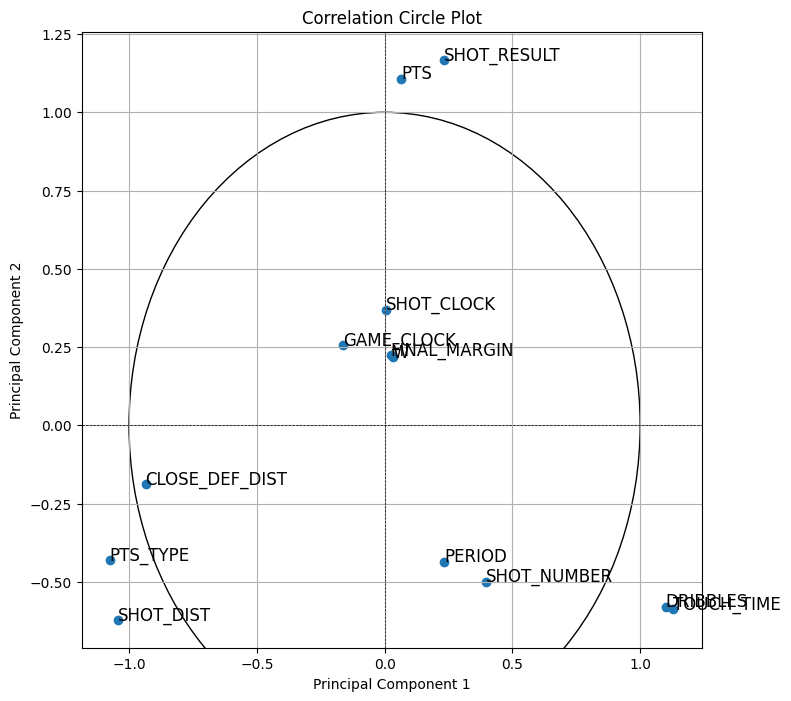

In [108]:
# Load the preprocessed DataFrame
visualize_df = pd.read_csv("shot_logs.csv")
visualize_df = preprocess(visualize_df)

# Drop irrelevant columns
drop_cols = ['GAME_ID', 'LOCATION', 'CLOSEST_DEFENDER', 'MATCHUP',  'CLOSEST_DEFENDER_PLAYER_ID', 'player_name', 'player_id']
visualize_df = visualize_df.drop(columns=drop_cols)

# Filter shots made with 2 points from distances less than 23.9
shots_2_points_within_23_9 = visualize_df[(visualize_df['PTS_TYPE'] == 2) & (visualize_df['SHOT_DIST'] < 23.9)]

# Filter shots made with 3 points from distances further than 23.9
shots_3_points_beyond_23_9 = visualize_df[(visualize_df['PTS_TYPE'] == 3) & (visualize_df['SHOT_DIST'] > 23.9)]

# Filter shots made with 3 points from distances less than 23.9
shots_3_points_within_23_9 = visualize_df[(visualize_df['PTS_TYPE'] == 3) & (visualize_df['SHOT_DIST'] < 23.9)]

# Count the number of shots for each category
shots_counts = [len(shots_2_points_within_23_9), len(shots_3_points_beyond_23_9), len(shots_3_points_within_23_9)]
labels = ['2 points < 23.9', '3 points > 23.9', '3 points < 23.9']

# Plot the counts in a pie chart
plt.figure(figsize=(8, 6))
plt.pie(shots_counts, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Shot Distribution by Point Type and Distance')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.legend(loc="upper right", bbox_to_anchor=(1, 0, 0.5, 1))
plt.show()

# Calculate the correlation matrix
corr_matrix = visualize_df.corr()

# Plot the heat map matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap="flare")
plt.show()

# Perform PCA (Principal Component Analysis)
pca = PCA(n_components=2)
pca.fit(corr_matrix)

# Transform the data
pca_components = pca.transform(corr_matrix)

# Plot correlation circle
plt.figure(figsize=(8, 8))
plt.scatter(pca_components[:, 0], pca_components[:, 1])

# Add variable names as annotations
for i, (x, y) in enumerate(pca_components):
    plt.text(x, y, corr_matrix.columns[i], fontsize=12)

# Add axes
plt.axhline(0, color='black', linestyle='--', linewidth=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5)

# Add circle
circle = plt.Circle((0,0), 1, color='black', fill=False)
plt.gca().add_artist(circle)

# Set labels and title
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Correlation Circle Plot")

plt.grid(True)
plt.show()

### Outliers detection

columns with null values found:  ['SHOT_CLOCK']


C:\Users\anase\AppData\Local\Temp\ipykernel_7136\1741174936.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[column] = data[column].fillna(method='ffill')


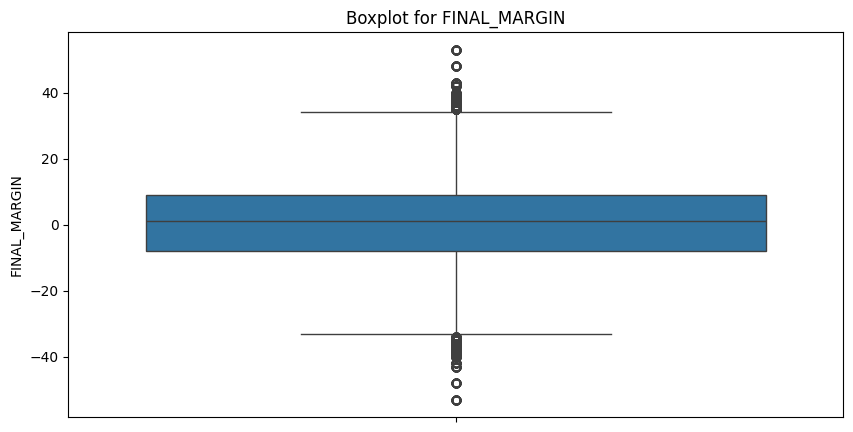

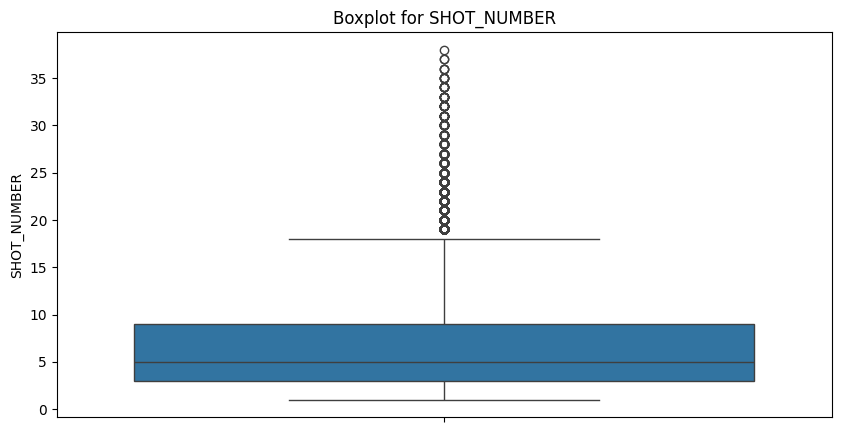

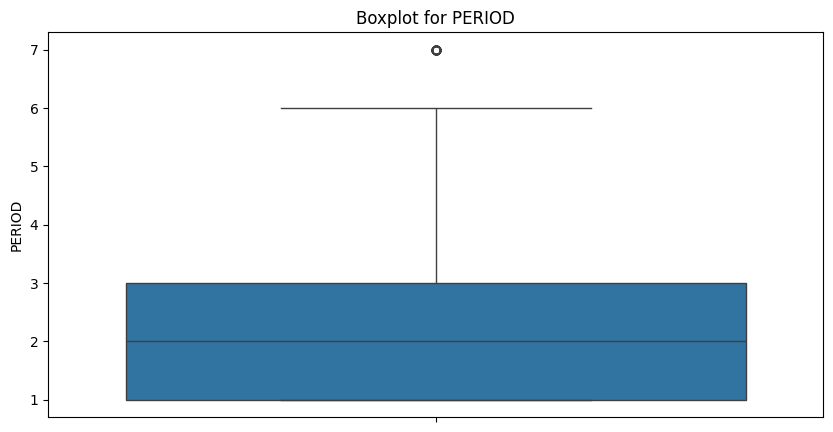

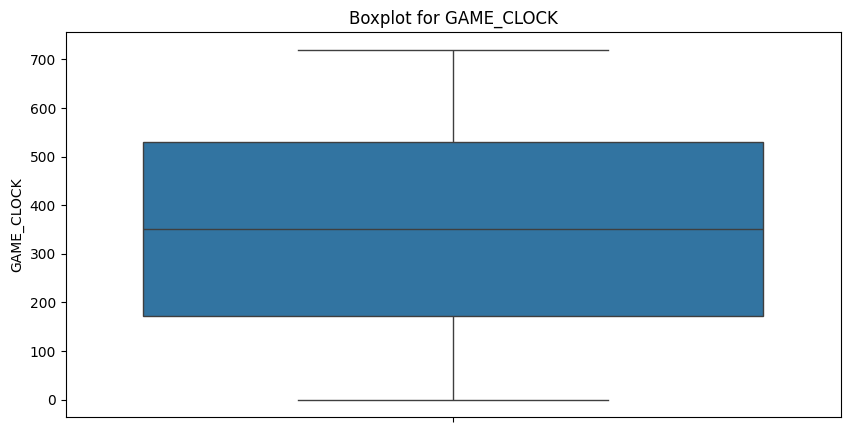

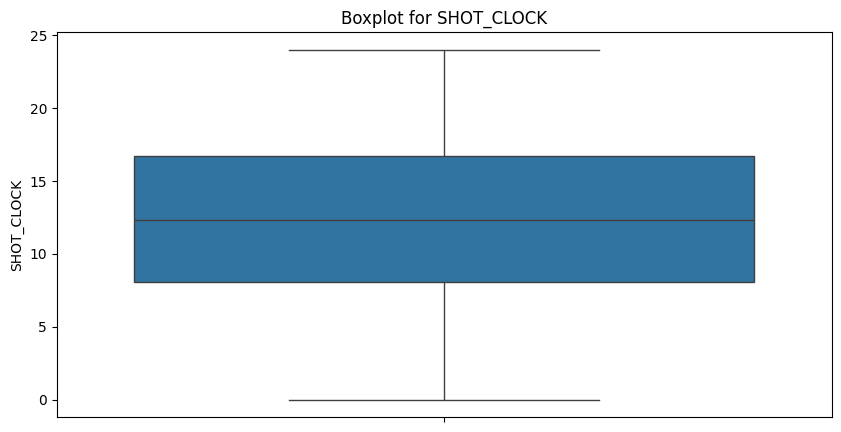

...

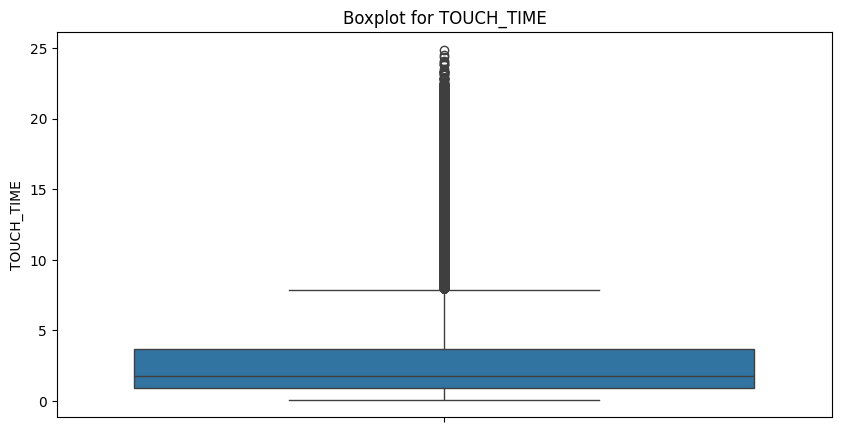

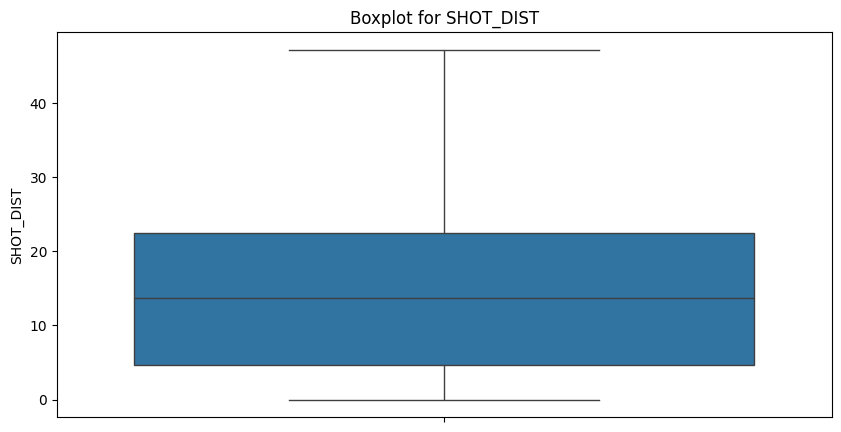

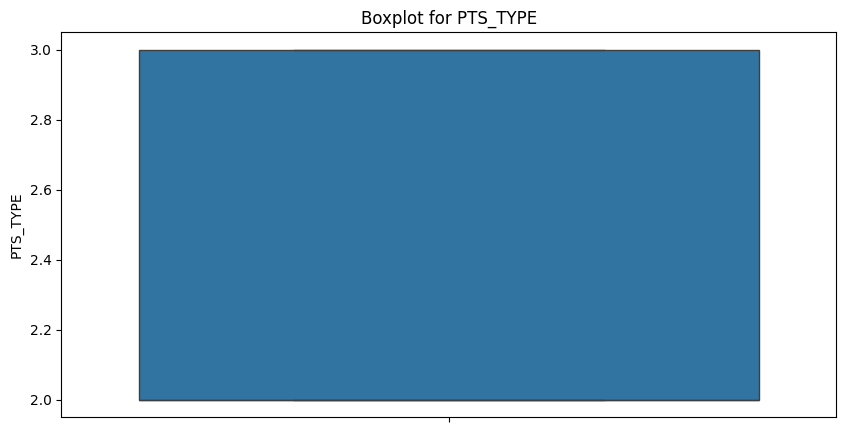

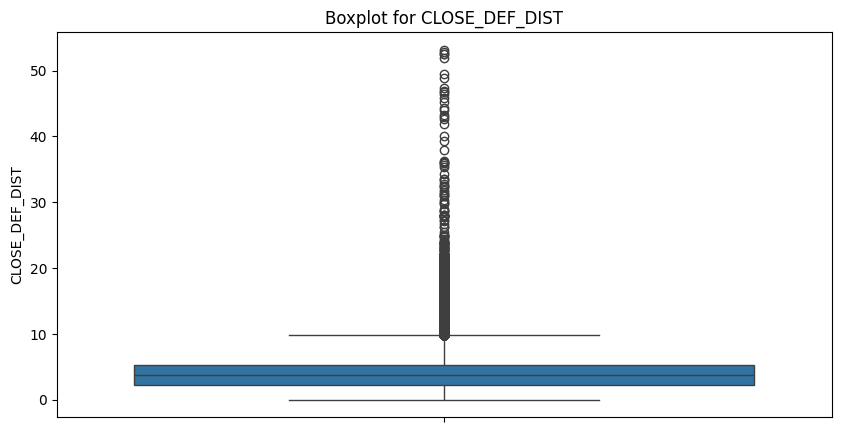

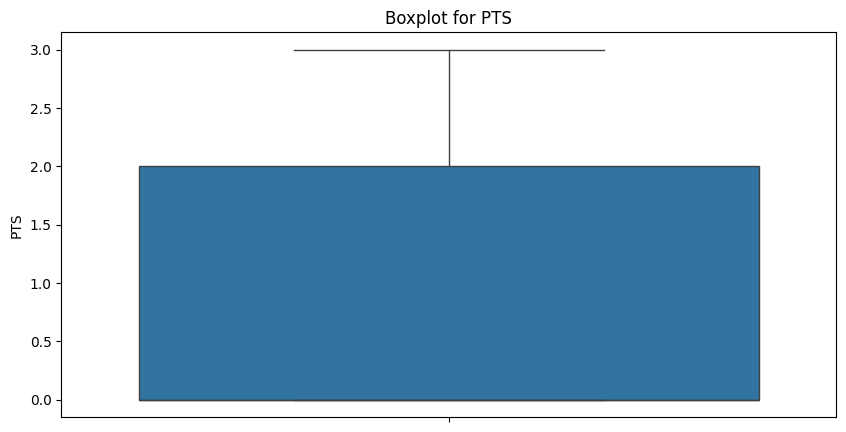

In [109]:
# Read the CSV file into a DataFrame
df = pd.read_csv("shot_logs.csv")
df = preprocess(df)

# Select the relevant features
selected_features = ["FINAL_MARGIN", "SHOT_NUMBER", "PERIOD", "GAME_CLOCK", "SHOT_CLOCK", "DRIBBLES",
                    "TOUCH_TIME", "SHOT_DIST", "PTS_TYPE", "CLOSE_DEF_DIST", "PTS"]

df = df[selected_features]

# Create boxplots for each feature excluding outliers
for col in df.columns:
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df[col], showfliers=True)
    plt.title(f"Boxplot for {col}")
    plt.show()

### Training and comparing models

#### Defining constants for the models

In [110]:
# Read the csv file into a DataFrame
model_df = pd.read_csv("shot_logs.csv")
model_df = preprocess(model_df)

# Define the feature columns
feature_cols = ['SHOT_DIST', 'CLOSE_DEF_DIST', 'DRIBBLES', 'SHOT_CLOCK']

# Define the target variable
target_col = 'SHOT_RESULT'

# Split the data into features and target variable
X = model_df[feature_cols]
y = model_df[target_col]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)


columns with null values found:  ['SHOT_CLOCK']


C:\Users\anase\AppData\Local\Temp\ipykernel_7136\1741174936.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[column] = data[column].fillna(method='ffill')


#### 1. Logistic Regression

In [111]:
# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the logistic regression model
logreg = LogisticRegression()
logreg.fit(X_train_scaled, y_train)

# Predict the target variable for the testing set
y_pred = logreg.predict(X_test_scaled)

# Print the model prediction table
result_df = X_test.copy()
result_df['SHOT_RESULT'] = y_test.values
result_df['prediction'] = y_pred
print(result_df.to_string(index=False))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

# Evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
print("Logistic Regression Accuracy:", accuracy)

# Precision
precision = precision_score(y_test, y_pred)
print("Precision:", precision)

# Recall
recall = recall_score(y_test, y_pred)
print("Recall:", recall)

# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

 SHOT_DIST  CLOSE_DEF_DIST  DRIBBLES  SHOT_CLOCK  SHOT_RESULT  prediction
      25.9             4.5         1        13.2            0           0
       4.8             1.1         0        17.5            0           1
      18.0             3.6         6         2.9            1           0
      25.7             4.4         0        10.6            0           0
       5.8             2.6         8        14.9            0           1
       3.9             5.2         2        21.2            0           1
      17.2             4.1         0        10.3            1           0
       0.8             0.9         0        24.0            1           1
       0.4             4.0         1        20.2            1           1
       4.9             2.3         0        10.9            1           1
      24.0             4.6         1        22.0            0           0
       5.7             0.7         1         8.8            0           0
       2.6             0.5         0  

#### 2. Random Forest

In [112]:
# Scale the features
scaler_rf = StandardScaler()
X_train_scaled_rf = scaler_rf.fit_transform(X_train)
X_test_scaled_rf = scaler_rf.transform(X_test)

# Create and train the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train_scaled_rf, y_train)

# Predict the target variable for the testing set
y_pred_rf = rf_classifier.predict(X_test_scaled_rf)

# Print the model prediction table
result_df_rf = X_test.copy()
result_df_rf['SHOT_RESULT'] = y_test.values
result_df_rf['prediction'] = y_pred_rf
print(result_df_rf.to_string(index=False))

# Confusion Matrix
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
print("Confusion Matrix:\n", conf_matrix_rf)

# Evaluate the model performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Random Forest Classifier Accuracy:", accuracy_rf)

# Precision
precision_rf = precision_score(y_test, y_pred_rf)
print("Precision:", precision_rf)

# Recall
recall_rf = recall_score(y_test, y_pred_rf)
print("Recall:", recall_rf)

# F1 Score
f1_rf = f1_score(y_test, y_pred_rf)
print("F1 Score:", f1_rf)

 SHOT_DIST  CLOSE_DEF_DIST  DRIBBLES  SHOT_CLOCK  SHOT_RESULT  prediction
      25.9             4.5         1        13.2            0           0
       4.8             1.1         0        17.5            0           1
      18.0             3.6         6         2.9            1           0
      25.7             4.4         0        10.6            0           0
       5.8             2.6         8        14.9            0           1
       3.9             5.2         2        21.2            0           1
      17.2             4.1         0        10.3            1           0
       0.8             0.9         0        24.0            1           0
       0.4             4.0         1        20.2            1           1
       4.9             2.3         0        10.9            1           1
      24.0             4.6         1        22.0            0           0
       5.7             0.7         1         8.8            0           0
       2.6             0.5         0  

#### 3. K nearest neighbors

In [113]:
# Scale the features
scaler_knn = StandardScaler()
X_train_scaled_knn = scaler_knn.fit_transform(X_train)
X_test_scaled_knn = scaler_knn.transform(X_test)

# Create and train the K-Nearest Neighbors classifier
knn_classifier = KNeighborsClassifier()
knn_classifier.fit(X_train_scaled_knn, y_train)

# Predict the target variable for the testing set
y_pred_knn = knn_classifier.predict(X_test_scaled_knn)

# Print the model prediction table
result_df_knn = X_test.copy()
result_df_knn['SHOT_RESULT'] = y_test.values
result_df_knn['prediction'] = y_pred_knn
print(result_df_knn.to_string(index=False))

# Confusion Matrix
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
print("Confusion Matrix:\n", conf_matrix_knn)

# Evaluate the model performance
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print("K-Nearest Neighbors Classifier Accuracy:", accuracy_knn)

# Precision
precision_knn = precision_score(y_test, y_pred_knn)
print("Precision:", precision_knn)

# Recall
recall_knn = recall_score(y_test, y_pred_knn)
print("Recall:", recall_knn)

# F1 Score
f1_knn = f1_score(y_test, y_pred_knn)
print("F1 Score:", f1_knn)

 SHOT_DIST  CLOSE_DEF_DIST  DRIBBLES  SHOT_CLOCK  SHOT_RESULT  prediction
      25.9             4.5         1        13.2            0           1
       4.8             1.1         0        17.5            0           1
      18.0             3.6         6         2.9            1           1
      25.7             4.4         0        10.6            0           0
       5.8             2.6         8        14.9            0           0
       3.9             5.2         2        21.2            0           1
      17.2             4.1         0        10.3            1           0
       0.8             0.9         0        24.0            1           1
       0.4             4.0         1        20.2            1           1
       4.9             2.3         0        10.9            1           0
      24.0             4.6         1        22.0            0           0
       5.7             0.7         1         8.8            0           0
       2.6             0.5         0  

#### 4. Gradient Boosting Classifier

In [114]:
# Scale the features
scaler_gb = StandardScaler()
X_train_scaled_gb = scaler_gb.fit_transform(X_train)
X_test_scaled_gb = scaler_gb.transform(X_test)

# Create and train the Gradient Boosting classifier
gb_classifier = GradientBoostingClassifier(random_state=42)
gb_classifier.fit(X_train_scaled_gb, y_train)

# Predict the target variable for the testing set
y_pred_gb = gb_classifier.predict(X_test_scaled_gb)

# Print the model prediction table
result_df_gb = X_test.copy()
result_df_gb['SHOT_RESULT'] = y_test.values
result_df_gb['prediction'] = y_pred_gb
print(result_df_gb.to_string(index=False))

# Confusion Matrix
conf_matrix_gb = confusion_matrix(y_test, y_pred_gb)
print("Confusion Matrix:\n", conf_matrix_gb)

# Evaluate the model performance
accuracy_gb = accuracy_score(y_test, y_pred_gb)
print("Gradient Boosting Classifier Accuracy:", accuracy_gb)

# Precision
precision_gb = precision_score(y_test, y_pred_gb)
print("Precision:", precision_gb)

# Recall
recall_gb = recall_score(y_test, y_pred_gb)
print("Recall:", recall_gb)

# F1 Score
f1_gb = f1_score(y_test, y_pred_gb)
print("F1 Score:", f1_gb)


 SHOT_DIST  CLOSE_DEF_DIST  DRIBBLES  SHOT_CLOCK  SHOT_RESULT  prediction
      25.9             4.5         1        13.2            0           0
       4.8             1.1         0        17.5            0           1
      18.0             3.6         6         2.9            1           0
      25.7             4.4         0        10.6            0           0
       5.8             2.6         8        14.9            0           0
       3.9             5.2         2        21.2            0           1
      17.2             4.1         0        10.3            1           0
       0.8             0.9         0        24.0            1           1
       0.4             4.0         1        20.2            1           1
       4.9             2.3         0        10.9            1           0
      24.0             4.6         1        22.0            0           0
       5.7             0.7         1         8.8            0           0
       2.6             0.5         0  

### Map Reduce

In [115]:
#--------------------------Map Reduce Data Preprocessing--------------------------

def mrpreprocess(data):
    null_columns = [column for column in data.columns if data.filter(data[column].isNull()).count() > 0]

    # Fill null values in identified columns with forward fill
    for column in null_columns:
        window = Window.orderBy(F.monotonically_increasing_id())
        data = data.withColumn(column, F.last(column, ignorenulls=True).over(window))

    # Drop the FGM column
    data = data.drop("FGM")

    # Replace the shot_made_flag column with 0 or 1
    data = data.withColumn("SHOT_RESULT", F.when(F.col("SHOT_RESULT") == "made", 1).otherwise(0))

    # Calculate positive mean value for TOUCH_TIME
    positive_touch_time_mean = data.filter(F.col("TOUCH_TIME") > 0).agg(F.mean("TOUCH_TIME")).collect()[0][0]

    # Replace negative values in TOUCH_TIME with positive mean
    data = data.withColumn("TOUCH_TIME", F.when(F.col("TOUCH_TIME") < 0, F.lit(positive_touch_time_mean)).otherwise(F.col("TOUCH_TIME")))

    # Calculate the time remaining in the game in seconds
    data = data.withColumn("GAME_CLOCK", F.substring(F.col("GAME_CLOCK"), 12, 8))
    data = data.withColumn("GAME_CLOCK",
                    F.expr("CAST(split(GAME_CLOCK, ':')[0] AS INT)*60 + CAST(split(GAME_CLOCK, ':')[1] AS INT)"))

    return data

In [116]:
# Map Reduce كابتن عماد متعب using PySpark

# Create a map reduce function to calculate the most scoring player within the last 30 seconds of the last quarter

# Create a Spark session
spark = SparkSession.builder.master("local").appName("Emad Met3eb Map Reduce").getOrCreate()

# Load the DataFrame
mr_df = spark.read.csv("shot_logs.csv", header=True, inferSchema=True)
mr_df = mrpreprocess(mr_df)

# Filter the shots made within the last 30 seconds of the last quarter
last_30_seconds_last_quarter = mr_df.filter((fcol("PERIOD") >= 4) & (fcol("GAME_CLOCK") <= 30) & (fcol("W") == "W"))

# Group by player name and calculate total points made
player_points = last_30_seconds_last_quarter.groupBy("player_name").agg(sum("PTS").alias("total_points_made"))

print("Most Scoring Player(s) within the Last 30 Seconds of the Last Quarter :")
# Sort the players by total points made
player_points_sorted = player_points.sort(F.desc("total_points_made"))
# show the top 10 players
player_points_sorted.show(10)


Most Scoring Player(s) within the Last 30 Seconds of the Last Quarter :
+--------------+-----------------+
|   player_name|total_points_made|
+--------------+-----------------+
|  james harden|               23|
|  kemba walker|               17|
|   mike conley|               17|
|damian lillard|               17|
|brandon knight|               13|
|  jarrett jack|               13|
|    mnta ellis|               10|
|  donald sloan|                9|
|    marc gasol|                9|
|  derrick rose|                9|
+--------------+-----------------+
only showing top 10 rows



In [117]:
# Map Reduce كابتن عماد متعب from scratch
# Create a map reduce function to calculate the most scoring player within the last 30 seconds of the last quarter

# Define the mapper function
def mapper(record):
    # Filter the shots made within the last 30 seconds of the last quarter
    key = (record['player_name'])
    if record['PERIOD'] >= 4 and record['GAME_CLOCK'] <= 30.0 and record['W'] == 1:
        return (key, {'pts': record['PTS'], 'count': 1})
    return None
    
# Define the reducer function
def reducer(accumulator, new_data):
    player_key, data = new_data
    if player_key in accumulator:
        accumulator[player_key]['pts'] += data['pts']
        accumulator[player_key]['count'] += data['count']
    else:
        accumulator[player_key] = data
    return accumulator

# Load the data
data = pd.read_csv("shot_logs.csv")
data = preprocess(data)

# Convert the DataFrame to a list of dictionaries
data_dict = data.to_dict('records')

# Mapping
mapped_data = [mapper(record) for record in data_dict if mapper(record) is not None]
print("Mapped Data:", mapped_data)

# Reducing
reduced_data = {}
for item in mapped_data:
    reduced_data = reducer(reduced_data, item)

print("Reduced Data:", reduced_data)

# Sort the players by total points made
top_players = sorted(reduced_data, key=lambda x: reduced_data[x]['pts'], reverse=True)
top_five_players = top_players[:10]

print("Top 5 Scoring Met3eb within the Last 30 Seconds of the Last Quarter:")
for player in top_five_players:
    print(f"Player: {player}, Points: {reduced_data[player]['pts']}, Shots: {reduced_data[player]['count']}")


columns with null values found:  ['SHOT_CLOCK']


C:\Users\anase\AppData\Local\Temp\ipykernel_7136\1741174936.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[column] = data[column].fillna(method='ffill')


Mapped Data: [('al jefferson', {'pts': 2, 'count': 1}), ('gary neal', {'pts': 0, 'count': 1}), ('gerald henderson', {'pts': 0, 'count': 1}), ('gerald henderson', {'pts': 0, 'count': 1}), ('kemba walker', {'pts': 2, 'count': 1}), ('kemba walker', {'pts': 2, 'count': 1}), ('kemba walker', {'pts': 2, 'count': 1}), ('kemba walker', {'pts': 2, 'count': 1}), ('kemba walker', {'pts': 2, 'count': 1}), ('kemba walker', {'pts': 0, 'count': 1}), ('kemba walker', {'pts': 0, 'count': 1}), ('kemba walker', {'pts': 2, 'count': 1}), ('kemba walker', {'pts': 3, 'count': 1}), ('kemba walker', {'pts': 2, 'count': 1}), ('lance stephenson', {'pts': 3, 'count': 1}), ('marvin williams', {'pts': 2, 'count': 1}), ('marvin williams', {'pts': 0, 'count': 1}), ('jason maxiell', {'pts': 2, 'count': 1}), ('gordon hayward', {'pts': 0, 'count': 1}), ('gordon hayward', {'pts': 2, 'count': 1}), ('trevor booker', {'pts': 0, 'count': 1}), ('derrick favors', {'pts': 0, 'count': 1}), ('dante exum', {'pts': 0, 'count': 1}),

### Map Reduce to get the best defender

In [118]:
# Map Reduce best 3 pts shot with 0 dribbles with pyspark

spark = spark = SparkSession.builder.master("local").appName("Best Defender Map Reduce").getOrCreate()

# Load the DataFrame
mr_df = spark.read.csv("shot_logs.csv", header=True, inferSchema=True)

# Preprocess the data
mr_df = mrpreprocess(mr_df)

# Filter the shots made with 3 points and 0 dribbles
best_3pts_0_dribbles = mr_df.filter((fcol("PTS_TYPE") == 3) & (fcol("DRIBBLES") == 0) & (fcol("SHOT_RESULT") == 1))

# Group by the player name and calculate the number of shots made
best_shooter = best_3pts_0_dribbles.groupBy("player_name").agg(sum("SHOT_RESULT").alias("3_points_shots_made"))

print("Best shooter with 3 Points Shots and 0 Dribbles:")

# Sort the player by shots made
best_shooter_sorted = best_shooter.sort(F.desc("3_points_shots_made"))

# Show the top 10 players
best_shooter_sorted.show(10)

Best shooter with 3 Points Shots and 0 Dribbles:
+----------------+-------------------+
|     player_name|3_points_shots_made|
+----------------+-------------------+
|     kyle korver|                160|
| wesley matthews|                136|
|   klay thompson|                128|
|    trevor ariza|                120|
|       jj redick|                118|
|     danny green|                115|
|   channing frye|                112|
|      kevin love|                107|
|robert covington|                103|
|   ryan anderson|                102|
+----------------+-------------------+
only showing top 10 rows



In [119]:
# Map Reduce best 3 pts shot with 0 dribbles from scratch

# Define the mapper function
def mapper(record):
    key = (record['player_name'])
    if record['PTS_TYPE'] == 3 and record['DRIBBLES'] == 0 and record['SHOT_RESULT'] == 1:
        return (key, {'count': 1})
    return None

# Define the reducer function
def reducer(accumulator, new_data):
    player_key, data = new_data
    if player_key in accumulator:
        accumulator[player_key]['count'] += data['count']
    else:
        accumulator[player_key] = data
    return accumulator

# Load the data
data = pd.read_csv("shot_logs.csv")
data = preprocess(data)

# Convert the DataFrame to a list of dictionaries
data_dict = data.to_dict('records')

# Mapping
mapped_data = [mapper(record) for record in data_dict if mapper(record) is not None]

# Reducing
reduced_data = {}
for item in mapped_data:
    reduced_data = reducer(reduced_data, item)

# Sort the players by shots made
top_players = sorted(reduced_data, key=lambda x: reduced_data[x]['count'], reverse=True)

print("Top 10 Players with 3 Points Shots and 0 Dribbles:")
for player in top_players[:10]:
    print(f"Player: {player}, Shots: {reduced_data[player]['count']}")


columns with null values found:  ['SHOT_CLOCK']


C:\Users\anase\AppData\Local\Temp\ipykernel_7136\1741174936.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[column] = data[column].fillna(method='ffill')


Top 10 Players with 3 Points Shots and 0 Dribbles:
Player: kyle korver, Shots: 160
Player: wesley matthews, Shots: 136
Player: klay thompson, Shots: 128
Player: trevor ariza, Shots: 120
Player: jj redick, Shots: 118
Player: danny green, Shots: 115
Player: channing frye, Shots: 112
Player: kevin love, Shots: 107
Player: robert covington, Shots: 103
Player: ryan anderson, Shots: 102
